# 1. 탐색적 데이터 분석 (EDA)

### 라이브러리 및 데이터 불러오기

In [1]:
from geoband.API import *

In [2]:
import folium
import json
import geopandas as gpd

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import haversine

from shapely.geometry import Point, Polygon, MultiPolygon

import platform

from IPython.display import set_matplotlib_formats

if platform.system() == 'Darwin':
    plt.rc('font', family = 'AppleGothic')
elif platform.system() == 'Windows':
    plt.rc('font', family = 'Malgun Gothic')

plt.rc('axes', unicode_minus=False)

set_matplotlib_formats('retina')

import warnings
warnings.filterwarnings(action='ignore')

import pathlib
from tqdm import tqdm, notebook
import os

%matplotlib inline

/opt/app-root/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
# 데이터 불러오기
input_path = pathlib.Path('./data')
if not input_path.is_dir():
    input_path.mkdir()

GetCompasData('SBJ_2009_001', '1', input_path.joinpath('01.광양시_충전소설치현황.csv'))
GetCompasData('SBJ_2009_001', '3', input_path.joinpath('03.광양시_자동차등록현황_격자(100X100).geojson'))
GetCompasData('SBJ_2009_001', '6', input_path.joinpath('06.광양시_전기차보급현황(연도별,읍면동별).csv'))
GetCompasData('SBJ_2009_001', '7', input_path.joinpath('07.광양시_법정동별_인구현황(읍면동리).csv'))
GetCompasData('SBJ_2009_001', '8', input_path.joinpath('08.광양시_격자별인구현황(100X100).geojson'))
GetCompasData('SBJ_2009_001', '10', input_path.joinpath('10.광양시_상세도로망_LV6.geojson'))
GetCompasData('SBJ_2009_001', '11', input_path.joinpath('11.광양시_평일_일별_시간대별__추정교통량_LV6.csv'))
GetCompasData('SBJ_2009_001', '20', input_path.joinpath('20.광양시_행정경계(읍면동).geojson'))

# 국토정보맵 데이터
생산가능인구수 = gpd.read_file('./data/생산가능인구수/vl_blk.shp', encoding = 'EUC-KR')
주차장접근성 = gpd.read_file('./data/주차장접근성/주차장접근성.shp')

# COMPAS 데이터
충전소설치현황 = pd.read_csv('./data/01.광양시_충전소설치현황.csv')
자동차등록현황 = gpd.read_file('./data/03.광양시_자동차등록현황_격자(100X100).geojson')
전기차보급현황 = pd.read_csv('./data/06.광양시_전기차보급현황(연도별,읍면동별).csv')
인구현황 = pd.read_csv('./data/07.광양시_법정동별_인구현황(읍면동리).csv')
격자별인구현황 = gpd.read_file('./data/08.광양시_격자별인구현황(100X100).geojson')
상세도로망 = gpd.read_file('./data/10.광양시_상세도로망_LV6.geojson')
추정교통량 = pd.read_csv('./data/11.광양시_평일_일별_시간대별__추정교통량_LV6.csv')
행정경계 = gpd.read_file('./data/20.광양시_행정경계(읍면동).geojson')

## 1.1. 충전소설치현황

In [4]:
충전소설치현황.head()

,충전소명,충전소위치,충전기 운영기관,급속/완속,충전기용량,이용대수,충전기타입,요금정보(원/kw),lon,lat
0,LF스퀘어 광양점,전남 광양시 광양읍 순광로 466 1층,환경부(한국자동차환경협회),급속,200KW 동시충전,2,DC콤보,255.7,127.568300,34.963002
1,광양만권경제자유구역청,전남 광양시 광양읍 인덕로 1100(광양시 제2청사),환경부(한국자동차환경협회),급속,50KW,1,DC차데모/AC3상/DC콤보,255.7,127.583323,34.980334
2,광양송보파인빌5차아파트,전남 광양시 진등길 55-5 (마동 송보파인빌류 아파트) 501동~506동 상가동,케이티,완속,7kw/h,5,AC완속,170.0,127.689013,34.953759
3,광양시 모리스모텔,전남 광양시 광영로 118-1 지상주차장,차지비,완속,7kw/h,2,AC완속,250.0,127.716708,34.964032
4,광양시 백운쇼핑센타,전남 광양시 폭포사랑길 99 주차장,차지비,완속,7kw/h,2,AC완속,245.0,127.732440,34.940444


In [5]:
# 기존 설치된 충전소 지도 표시
center = (34.940710, 127.695920) # 광양시 시청 기준
zoom = 11
광양시_지도 = folium.Map(location = center,
                       zoom_start = zoom,
                    tiles='http://api.vworld.kr/req/wmts/1.0.0/7C5AEFC9-57EF-35BD-A78A-74C1DD916554/Base/{z}/{y}/{x}.png',
                    attr='My Data Attribution')
folium.GeoJson(행정경계).add_to(광양시_지도)

for i in 충전소설치현황.index:
    popup_name = 충전소설치현황['충전소명'][i] + '-' + 충전소설치현황['급속/완속'][i]
    if 충전소설치현황['급속/완속'][i] == '급속':
        icon_color = 'red' # 급속: 빨강
    else:
        icon_color = 'green' # 완속: 초록
    
    folium.Marker(
        location = (충전소설치현황['lat'][i], 충전소설치현황['lon'][i]),
        popup = popup_name,
        icon = folium.Icon(color=icon_color)
    ).add_to(광양시_지도)

광양시_지도

- 도심지 위주로 충전소들이 설치되어 있음 (중마동, 광양읍, 광영동, 금호동, 태인동)

## 1.2. 전기차보급현황

In [6]:
전기차보급현황.head()

,기준년도,행정구역,보급현황
0,2017,광양읍,17
1,2017,봉강면,0
2,2017,옥룡면,3
3,2017,옥곡면,3
4,2017,진상면,1


In [7]:
print('총 전기차 보급 현황: {}'.format(전기차보급현황['보급현황'].sum()))

총 전기차 보급 현황: 253


In [8]:
전기차보급현황.groupby(['행정구역'])['보급현황'].sum().sort_values(ascending=False)

행정구역
광양읍    102
중마동     78
금호동     23
광영동     12
옥룡면     11
옥곡면      8
진월면      5
진상면      5
봉강면      4
골약동      4
태인동      1
다압면      0
Name: 보급현황, dtype: int64

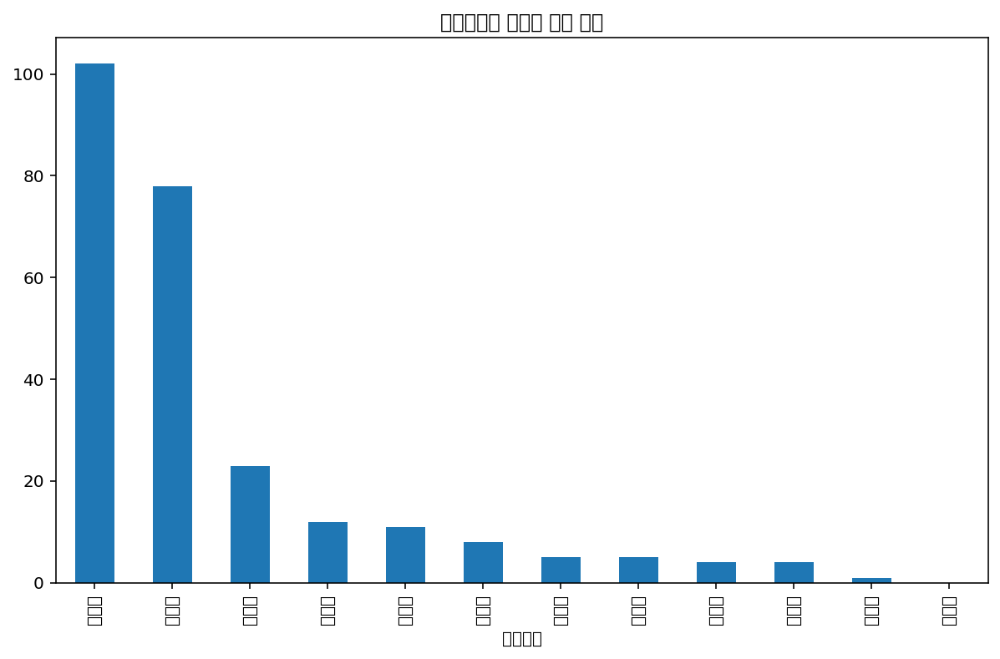

In [9]:
전기차보급현황.groupby(['행정구역'])['보급현황'].sum().sort_values(ascending=False).plot(kind = 'bar', title = '행정구역별 전기차 보급 현황', figsize=(10,6))
plt.show()

    - 광양읍과 중마동에 전기차 보급이 집중되어 있음

In [10]:
print('총 자동차 등록 현황: {}'.format(자동차등록현황['totale'].sum()))

총 자동차 등록 현황: 15862


In [11]:
print('전기차 비중: {:.3f}%'.format((253/15862*100)))

전기차 비중: 1.595%


## 1.3. 자동차등록현황

In [12]:
자동차등록현황

,id,totale,geometry
0,146,0,"POLYGON ((127.52550 35.07616, 127.52640 35.076..."
1,147,0,"POLYGON ((127.52550 35.07543, 127.52640 35.075..."
2,148,0,"POLYGON ((127.52550 35.07469, 127.52640 35.074..."
3,149,0,"POLYGON ((127.52550 35.07396, 127.52640 35.073..."
4,150,0,"POLYGON ((127.52550 35.07322, 127.52640 35.073..."
...,...,...,...
69954,117103,0,"POLYGON ((127.78602 35.01218, 127.78691 35.012..."
69955,117104,0,"POLYGON ((127.78602 35.01144, 127.78691 35.011..."
69956,117105,0,"POLYGON ((127.78602 35.01071, 127.78691 35.010..."
69957,117106,0,"POLYGON ((127.78602 35.00997, 127.78691 35.009..."


In [13]:
# 자동차등록현황 지도 표시
center = (34.940710, 127.695920) # 광양시 시청 기준
zoom = 11
광양시_지도 = folium.Map(location = center,
                       zoom_start = zoom,
                    tiles='http://api.vworld.kr/req/wmts/1.0.0/7C5AEFC9-57EF-35BD-A78A-74C1DD916554/Base/{z}/{y}/{x}.png',
                    attr='My Data Attribution')
folium.GeoJson(행정경계).add_to(광양시_지도)

# 1개 이상의 자동차가 등록된 지역
자동차_nonzero = 자동차등록현황.loc[자동차등록현황['totale'] !=0]
folium.Choropleth(
    geo_data = 자동차_nonzero,
    data = 자동차_nonzero,
    columns=['id', 'totale'],
    key_on='feature.properties.id',
    fill_color='YlGnBu'
).add_to(광양시_지도)

광양시_지도

- 전기차와 마찬가지로 광양읍과 중마동에 차량이 집중되어 있음.

## 1.4. 인구현황

In [14]:
인구현황.head()

,읍면동,법정리,세대수,계,남자,여자
0,광양읍,우산리,597,1318,658,660
1,광양읍,구산리,2628,7125,3530,3595
2,광양읍,칠성리,3921,7940,4051,3889
3,광양읍,읍내리,351,640,352,288
4,광양읍,목성리,1506,2827,1456,1371


In [15]:
인구현황.groupby(['읍면동'])['계'].sum().sort_values(ascending=False)

읍면동
중마동    58479
광양읍    49276
광영동    12534
금호동    12497
옥룡면     3118
진상면     2884
옥곡면     2850
진월면     2849
봉강면     2184
태인동     1839
다압면     1816
골약동     1690
Name: 계, dtype: int64

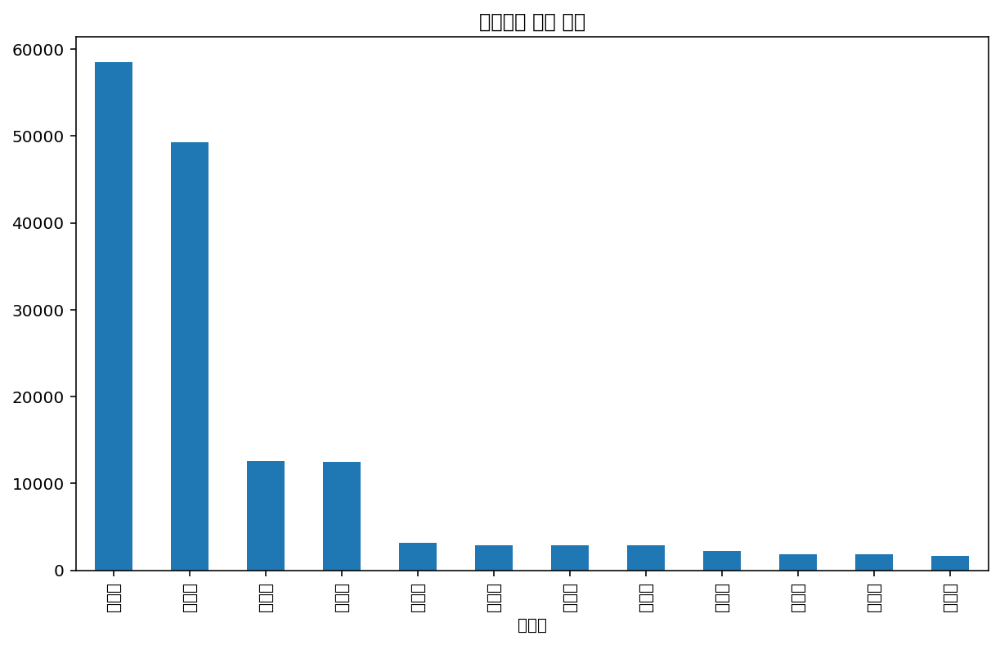

In [16]:
인구현황.groupby(['읍면동'])['계'].sum().sort_values(ascending=False).plot(kind = 'bar', title = '법정도별 인구 현황', figsize=(10,6))
plt.show()

- 광양읍과 중마동 두 지역에 인구와, 자동차, 전기차, 충전소가 밀집되어 있음
- 밀집도가 어느정도 충전소 설치에 영향을 미칠 것이라 생각함

## 1.5. 교통량

In [17]:
추정교통량.head()

,상세도로망_링크ID,도로등급,링크 길이,도로명,시도명,시군구명,읍면동명,시간적범위,평일주말,전체,승용차,버스,화물차
0,53680035001,101,0.242,NaN,전라남도,광양시,골약동,전일,평일,16425.8,9935.5,480.8,6009.5
1,53680031601,101,0.264,NaN,전라남도,광양시,골약동,전일,평일,15330.7,9862.1,737.8,4730.8
2,53680032201,101,0.554,NaN,전라남도,광양시,골약동,전일,평일,16425.8,9935.5,480.8,6009.5
3,53680032901,101,0.979,NaN,전라남도,광양시,골약동,전일,평일,15330.7,9862.1,737.8,4730.8
4,53680034801,101,0.116,NaN,전라남도,광양시,광양읍,전일,평일,15330.7,9862.1,737.8,4730.8


In [18]:
상세도로망['link_id'], 추정교통량['상세도로망_링크ID']

(0       535701707
 1       535701880
 2       535701883
 3       535703476
 4       535704746
           ...    
 3332    547105179
 3333    547105180
 3334    547105181
 3335    547105182
 3336    547105183
 Name: link_id, Length: 3337, dtype: object,
 0         53680035001
 1         53680031601
 2         53680032201
 3         53680032901
 4         53680034801
              ...     
 150871    53581530702
 150872    53581530701
 150873    53680295001
 150874    53680295002
 150875    53670047501
 Name: 상세도로망_링크ID, Length: 150876, dtype: int64)

- 추정교통량의 '상세도로망_링크ID' 뒤에 붙는 01, 02의 의미는 각각 상행, 하행을 나타냄.
- 도로등급이 '고속도로'인 경우 상,하행과 관련없이 대부분 01로 구분.
- __상세도로망의 'link_id'와 매칭시키기 위해서는 뒤에 두 자릿수를 빼야함.__

In [19]:
추정교통량['시간적범위'].unique()

array(['전일', '17', '18', '19', '20', '21', '22', '23', '0', '1', '2', '3',
       '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15',
       '16', 22, 23, 19, 20, 21, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
       13, 14, 15, 16, 17, 18], dtype=object)

- '시간적범위'의 데이터 타입이 섞여있음

In [20]:
#데이터 타입 string으로 통일
추정교통량['시간적범위'] = 추정교통량['시간적범위'].astype(str)
추정교통량['시간적범위'].unique()

array(['전일', '17', '18', '19', '20', '21', '22', '23', '0', '1', '2', '3',
       '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15',
       '16'], dtype=object)

- 전일과, 0~23시의 시간적범위가 있음.
- __전체 교통량이 중요하기에 '전일'만 사용.__

In [21]:
추정교통량['평일주말'].unique()

array(['평일'], dtype=object)

- '평일주말'엔 평일만 있음

- 승용차, 버스, 화물차의 교통량을 모두 더한 '전체' 컬럼만 사용.
- __필요한 컬럼: ['상세도로망_링크ID', '시간적_범위', '전체']__

In [22]:
# 상세도로망_링크ID 가공
추정교통량['상세도로망_링크ID'] = 추정교통량['상세도로망_링크ID'].astype(str)
추정교통량['link_id'] = 추정교통량['상세도로망_링크ID'].str.slice(start = 0, stop = 9)
추정교통량.drop('상세도로망_링크ID', axis = 1, inplace = True)

추정교통량 = 추정교통량.groupby(['link_id'])['전체'].sum().to_frame()
추정교통량.reset_index(level = ['link_id'], inplace = True)

In [23]:
추정교통량['link_id']

0       535701707
1       535701880
2       535701883
3       535703476
4       535704746
          ...    
3281    547105179
3282    547105180
3283    547105181
3284    547105182
3285    547105183
Name: link_id, Length: 3286, dtype: object

In [24]:
# 상세도로망 데이터와 추정교통량 데이터 합치기
추정교통량['link_id'] = 추정교통량['link_id'].astype(str)
교통량_gdf = pd.merge(상세도로망, 추정교통량, on = 'link_id', how = 'left')
교통량_gdf = 교통량_gdf[['link_id', '전체', 'geometry']]
# '전체' column명을 '교통량'으로 변경
교통량_gdf.rename(columns = {'전체':'교통량'}, inplace = True)

### 격자 데이터에 교통량 데이터 표현
- 생산가능인구수의 격자 사용

In [25]:
# 생산가능인구수의 좌표계를 EPSG:4326으로 변환함
생산가능인구수 = 생산가능인구수.to_crs({'init': 'epsg:4326'})

In [26]:
# 도로가 지나가는 격자에 교통량 데이터 입력
생산가능인구수['교통량'] = 0
for i in tqdm(교통량_gdf.index):
    for j in 생산가능인구수.index:
        if 교통량_gdf['geometry'][i].intersects(생산가능인구수['geometry'][j]):
            생산가능인구수['교통량'][j] += 교통량_gdf['교통량'][i]

100%|██████████| 3337/3337 [21:25<00:00,  2.60it/s]


In [27]:
# 교통량 지도에 표시
center = (34.940710, 127.695920) # 광양시 시청 기준
zoom = 11
광양시_지도 = folium.Map(location = center,
                       zoom_start = zoom,
                    tiles='http://api.vworld.kr/req/wmts/1.0.0/7C5AEFC9-57EF-35BD-A78A-74C1DD916554/Base/{z}/{y}/{x}.png',
                    attr='My Data Attribution')

folium.Choropleth(
    geo_data = 생산가능인구수,
    data = 생산가능인구수,
    columns=['gid', '교통량'],
    key_on='feature.properties.gid',
    fill_color = 'YlGnBu'
).add_to(광양시_지도)
광양시_지도

## 1.6. 주차장접근성

In [28]:
# 주차장접근성 데이터에서 광양시 데이터만 추출
주차장접근성_광양 = 주차장접근성[주차장접근성['sgg_nm_e'] == 'Gwangyang-si']
주차장접근성_광양.reset_index(inplace = True)

# 주차장접근성_광양 좌표계 변환
주차장접근성_광양 = 주차장접근성_광양.to_crs({'init': 'epsg:4326'})

In [29]:
# 주차장접근성 지도에 표시
center = (34.940710, 127.695920) # 광양시 시청 기준
zoom = 11
광양시_지도 = folium.Map(location = center,
                       zoom_start = zoom,
                    tiles='http://api.vworld.kr/req/wmts/1.0.0/7C5AEFC9-57EF-35BD-A78A-74C1DD916554/Base/{z}/{y}/{x}.png',
                    attr='My Data Attribution')

folium.Choropleth(
    geo_data = 주차장접근성_광양,
    data = 주차장접근성_광양,
    columns=['gid', 'value'],
    key_on='feature.properties.gid',
    fill_color = 'YlGnBu'
).add_to(광양시_지도)
광양시_지도

- 주차장접근성은 격자 중심점으로부터 가장 가까운 주차장까지 도로 이동거리이므로, 클수록 접근성이 좋지 않은 것
- 도심지역일수록 주차장 접근성이 대체로 좋음